In [2]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
from utils import constants as cnst
from eod import msg
from utils import u_grid, u_interpolate as u_int, constants as cnst, u_arrays, u_darrays, u_met
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as feature
import cartopy.io.shapereader as shapereader
import pickle as pkl
import glob
from scipy import stats

coast = shapereader.natural_earth(resolution='110m',
                                  category='physical',
                                  name='coastline')

countries = shapereader.natural_earth(resolution='110m',
                                      category='cultural',
                                      name='admin_0_countries')

pylab.rcParams['figure.figsize'] = (50., 50.)
%matplotlib inline

In [1]:
cd ..

/home/ck/pythonWorkspace/proj_CEH


In [6]:
path = cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/'
clim = '_ERA5_clim_mean_srfc.nc'
std = '_ERA5_clim_stddev_srfc.nc'
mcs = '_ERA5_5MCS_5mm_mean_5-8N_srfc.nc'

In [47]:
clim_pl = '_ERA5_clim_mean_pl.nc'
std_pl = '_ERA5_clim_stddev_pl.nc'
mcs_pl = '_ERA5_5MCS_5mm_mean_5-8N_5MCS_pl.nc'

In [48]:
import matplotlib.patches as patches
def draw_map(ax, t, lat, lon, title='', levels=None, quiver=None, contour=None, barlabel=None, cmap='viridis'):
   
    plt.contourf(lon, lat, t, transform=ccrs.PlateCarree(), cmap=cmap, levels=levels, extend='both')
    ax.coastlines()

#     ## quiver list
#     if quiver is not None:
#         qu = ax.quiver(quiver['x'], quiver['y'], quiver['u'], quiver['v'],scale=quiver['scale'], width=0.003, headwidth=3.2)
    
    
        ## additional contour on plot   
    #contour=None
    if contour is not None:
        contours = ax.contour(contour['x'], contour['y'], contour['data'], levels=contour['levels'], colors='r', linewidths=2 )
        plt.clabel(contours, inline=True, fontsize=7, fmt='%1.1f')
    
    # Gridlines
    xl = ax.gridlines(draw_labels=True);
    xl.xlabels_top = False
    xl.ylabels_right = False
    xl.xlines = False
    xl.ylines=False
    # Countries
    ax.add_feature(cartopy.feature.BORDERS, linestyle='--', color='grey');
    
#     rect2 = patches.Rectangle((box[0],box[2]),box[1]-box[0],box[3]-box[2],linewidth=1,edgecolor='green',facecolor='none', zorder=99)
        
#     ax.add_patch(rect2)
    
    plt.title(title)
    cbar = plt.colorbar()
    cbar.set_label(barlabel)

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attrib

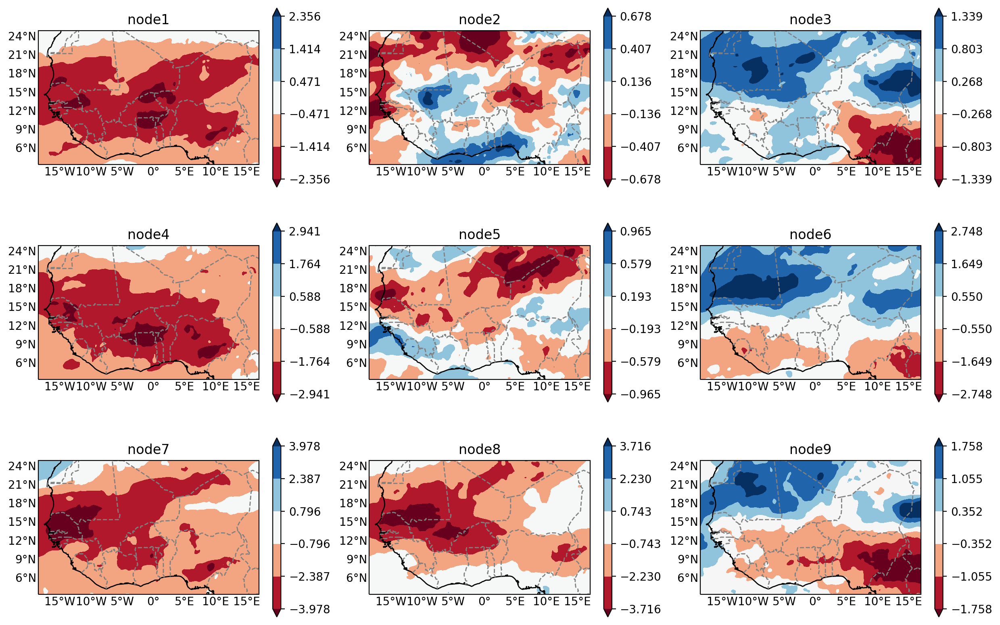

In [49]:
var = 'u'
f = plt.figure(figsize=(15,10), dpi=200)
for ni in range(1,10):
    nodestr = 'node'+str(ni)
    ax = f.add_subplot(3,3,ni, projection=ccrs.PlateCarree())
    cc = xr.open_dataset(path+nodestr+clim_pl) #xr.open_dataset(path+'node3'+mcs_pl) #
    mm = xr.open_dataset(path+nodestr+mcs_pl)
    stda = xr.open_dataset(path+nodestr+std_pl)

    diff = (mm[var].sel(level=650)-mm[var].sel(level=925))-(cc[var].sel(level=650)-cc[var].sel(level=925))#(mm[var]-cc[var])#
    
    #diff = (mm[var].sel(level=650))-(cc[var].sel(level=650))
    # sd = stda[var]
    # mask = np.abs(diff) > sd
    #ipdb.set_trace()
    #levs = np.linspace(1005,1018,8)

    edge = np.max([np.abs(np.percentile(diff,5)),np.abs(np.percentile(diff,95))])
    levs = np.linspace(edge*-1,edge,6)
    
#     if ni == 3:
#         levs = [0,1]

    draw_map(ax, diff, diff.latitude, diff.longitude, title=nodestr, levels=levs, barlabel='', cmap='RdBu')

    ax.set_ylim(3.5,25)
    ax.set_xlim(-18.5,17)

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)


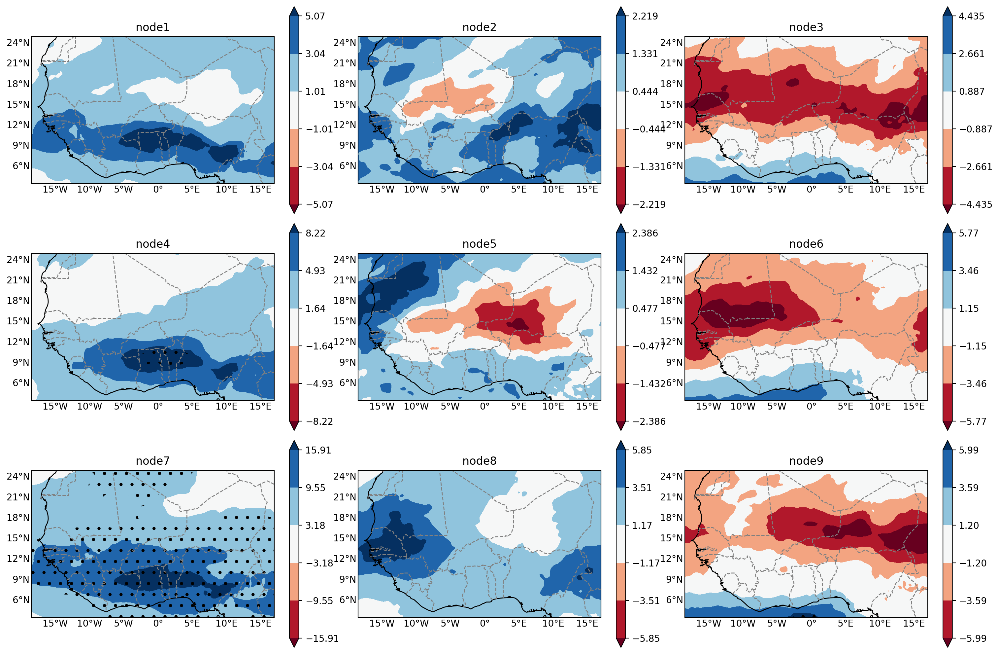

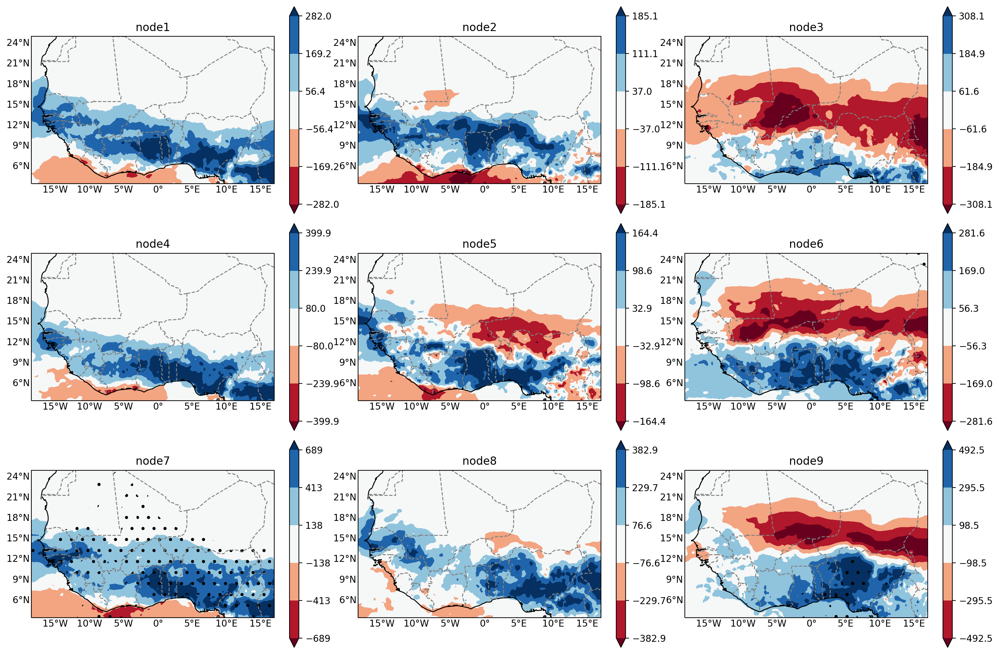

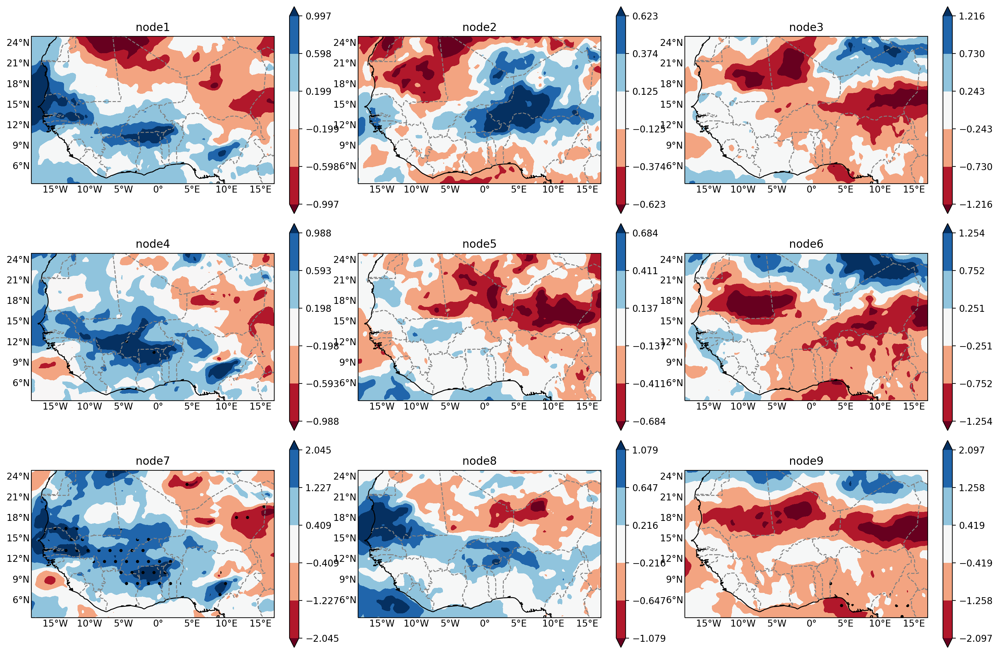

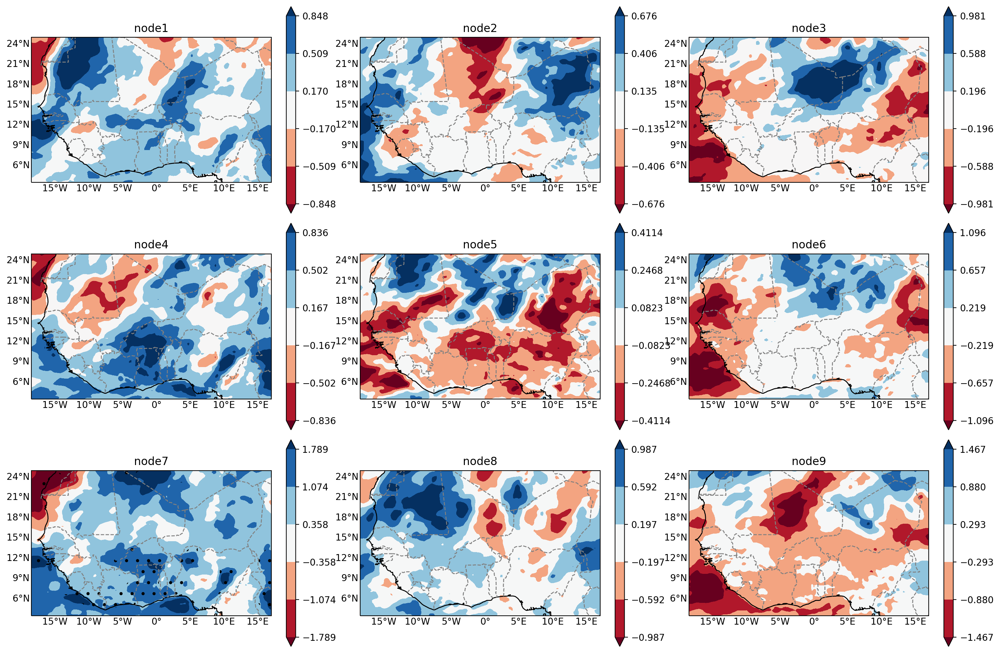

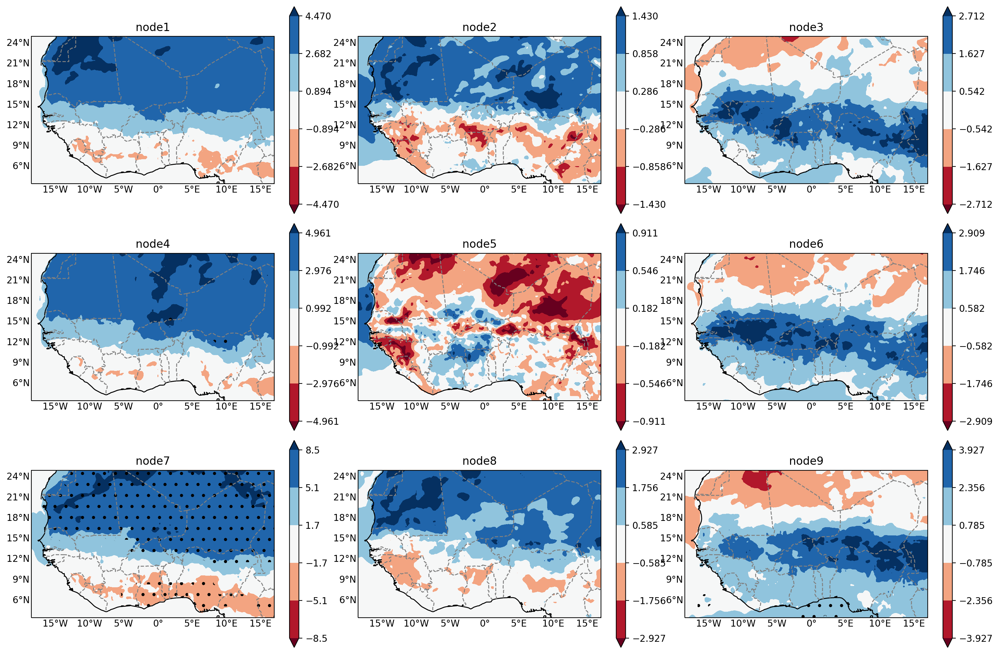

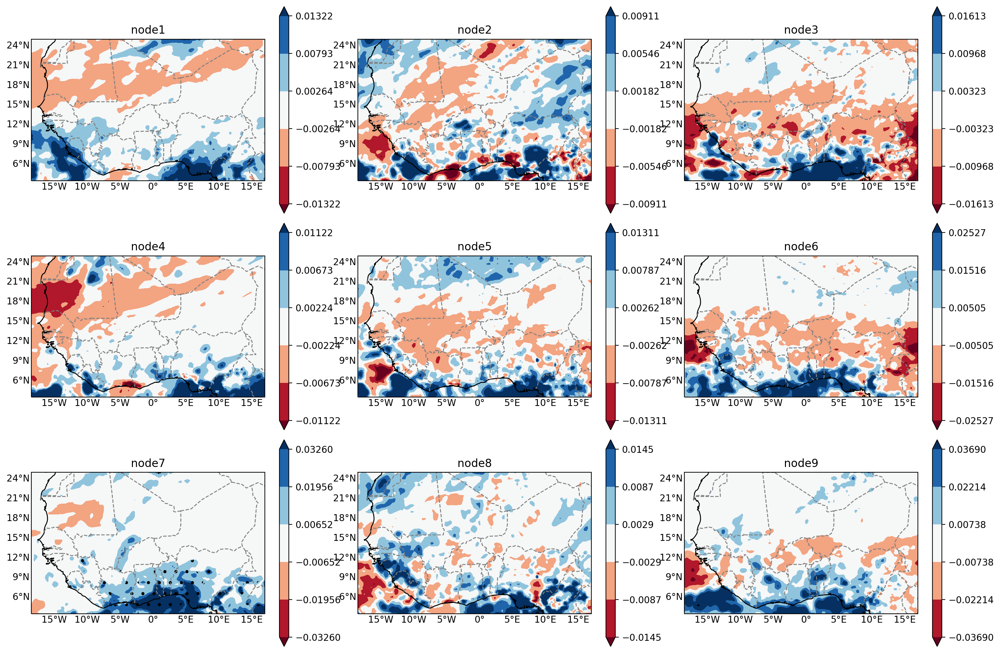

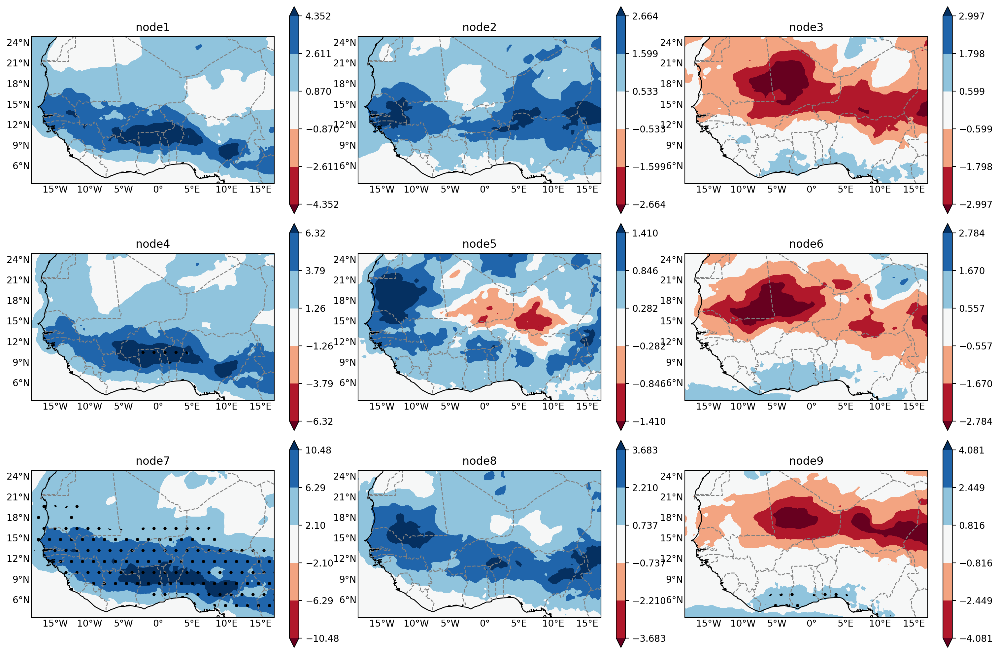

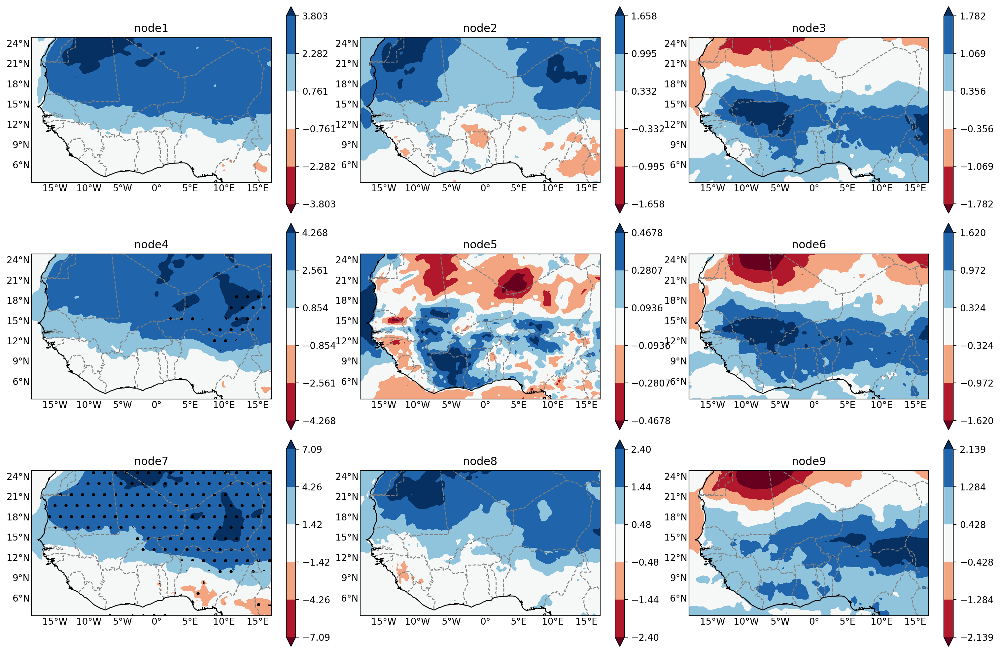

In [34]:
for var in ['tcwv', 'cape', 'u10', 'v10', 'skt', 'tciw', 'd2m', 't2m']:
    f = plt.figure(figsize=(15,10), dpi=200)
    for ni in range(1,10):
        nodestr = 'node'+str(ni)
        ax = f.add_subplot(3,3,ni, projection=ccrs.PlateCarree())
        cc = xr.open_dataset(path+nodestr+clim)
        mm = xr.open_dataset(path+nodestr+mcs)
        stda = xr.open_dataset(path+nodestr+std)

        diff = (mm[var]-cc[var])#
        sd = stda[var]
        mask = np.abs(diff) > sd
        #ipdb.set_trace()
        #levs = np.linspace(1005,1018,8)

        edge = np.max([np.abs(np.percentile(diff,5)),np.abs(np.percentile(diff,95))])
        levs = np.linspace(edge*-1,edge,6)

        draw_map(ax, diff, diff.latitude, diff.longitude, title=nodestr, levels=levs, barlabel='', cmap='RdBu')
        ax.contourf(diff.longitude, diff.latitude, mask, colors='none', hatches='.',
                     levels=[0.5, 1], linewidth=0.1)
        ax.set_ylim(3.5,25)
        ax.set_xlim(-18.5,17)
        #diff.plot()

    plt.tight_layout()
    #f.savefig(cnst.network_data + 'figs/SOMS/5-9N_3x3_fullYear/'+str(var)+'_anomaly_per_node_5-9N_3x3.jpg')

In [16]:
path = cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/'
clim = '_ERA5_clim_mean_pl.nc'
std = '_ERA5_clim_stddev_pl.nc'
mcs = '_ERA5_5MCS_5mm_mean_5-8N_pl.nc'

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/

/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:307: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/gridliner.py:343: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:1508: UserWarning: The following kwargs were not used by contour: 'linewidth'
  result = matplotlib.axes.Axes.contourf(self, *args, **kwargs)
/home/ck/miniconda3/lib/python3.7/site-packages/cartopy/mpl/style.py:90: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


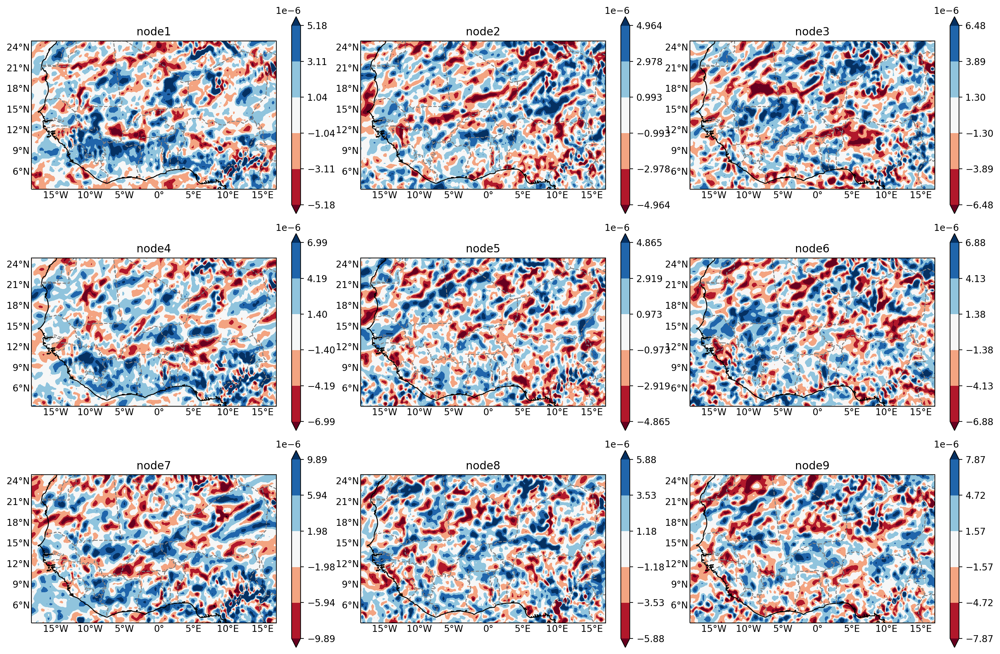

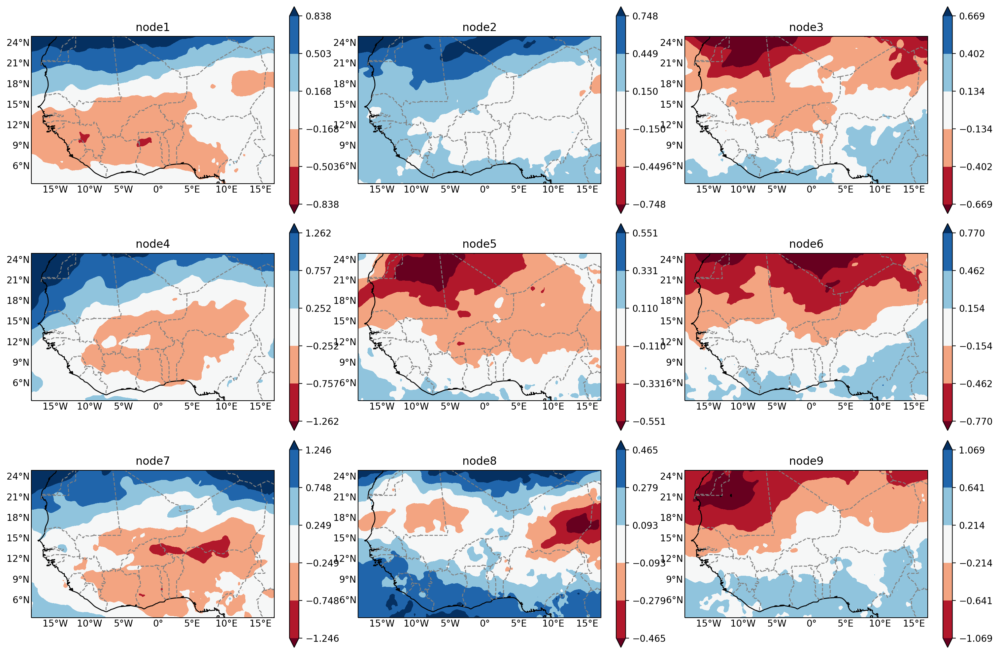

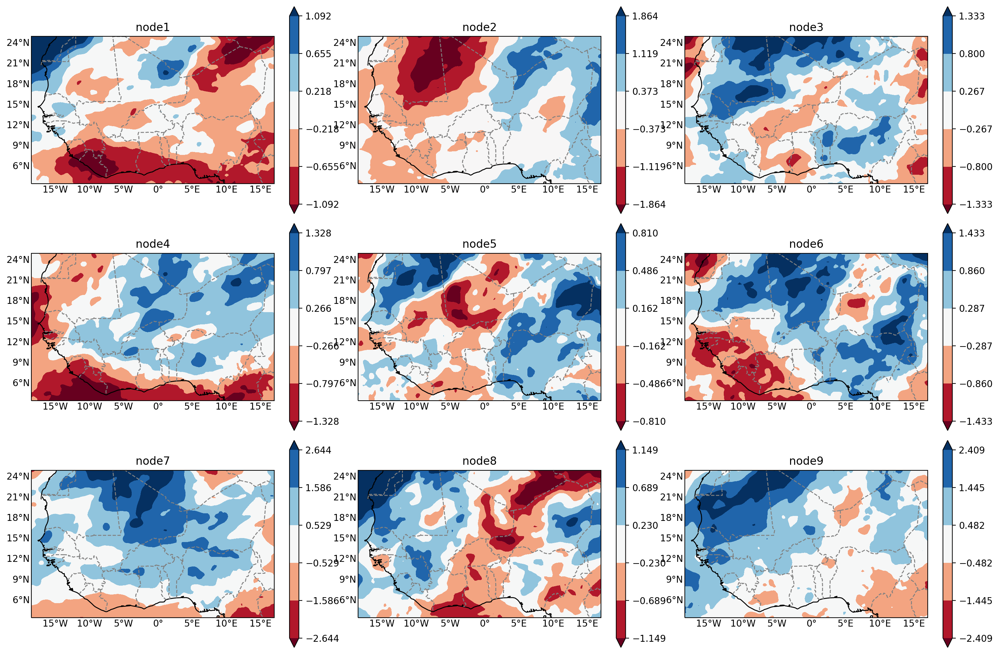

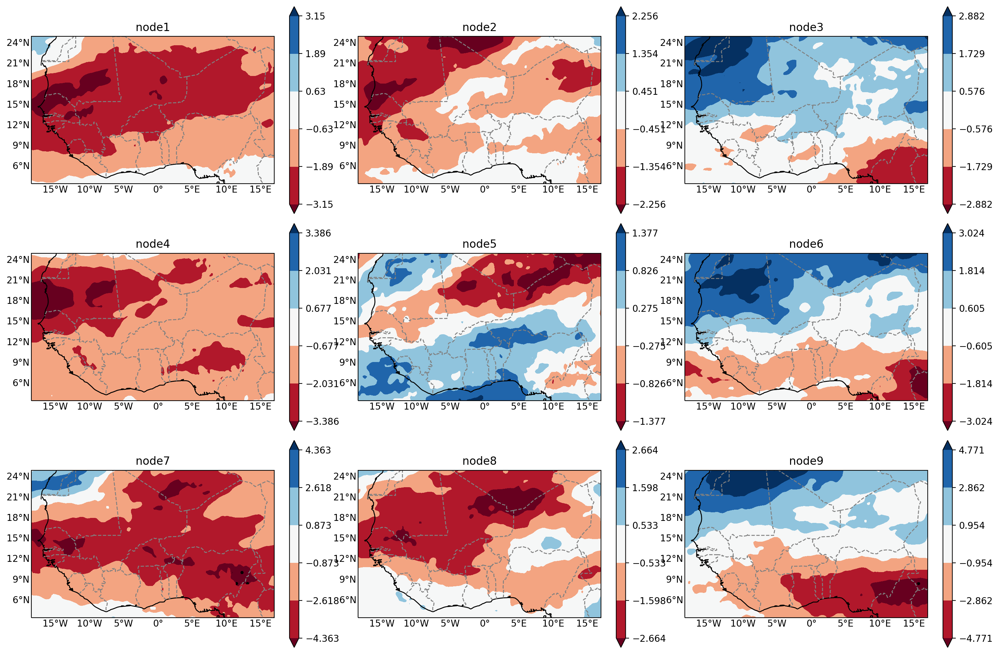

In [17]:
for var in ['d', 't', 'v', 'u']:
    f = plt.figure(figsize=(15,10), dpi=200)
    for ni in range(1,10):
        nodestr = 'node'+str(ni)
        ax = f.add_subplot(3,3,ni, projection=ccrs.PlateCarree())
        cc = xr.open_dataset(path+nodestr+clim)
        mm = xr.open_dataset(path+nodestr+mcs)
        stda = xr.open_dataset(path+nodestr+std)
        pll=650
        diff = (mm[var]-cc[var]).sel(level=pll).squeeze()#
        sd = stda[var].sel(level=pll).squeeze()
        mask = np.abs(diff) > sd
        #ipdb.set_trace()
        #levs = np.linspace(1005,1018,8)

        edge = np.max([np.abs(np.percentile(diff,5)),np.abs(np.percentile(diff,95))])
        levs = np.linspace(edge*-1,edge,6)

        draw_map(ax, diff, diff.latitude, diff.longitude, title=nodestr, levels=levs, barlabel='', cmap='RdBu')
        ax.contourf(diff.longitude, diff.latitude, mask, colors='none', hatches='.',
                     levels=[0.5, 1], linewidth=0.1)
        ax.set_ylim(3.5,25)
        ax.set_xlim(-18.5,17)
        #diff.plot()

    plt.tight_layout()
    f.savefig(cnst.network_data + 'figs/SOMS/5-9N_3x3_fullYear/'+str(var)+'_anomaly_per_node_5-9N_3x3_pl_'+str(pll)+'hPa.jpg')

In [18]:
sig_shear = pd.DataFrame(np.zeros((9,9)), columns=[1,2,3,4,5,6,7,8,9], index=np.arange(9)+1)

In [19]:
sig_shear

,1,2,3,4,5,6,7,8,9
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
# check significance of every node mean against every other node mean

sig_shear = pd.DataFrame(np.zeros((9,9)), columns=[1,2,3,4,5,6,7,8,9], index=np.arange(9)+1)
sig_tcw = pd.DataFrame(np.zeros((9,9)), columns=[1,2,3,4,5,6,7,8,9], index=np.arange(9)+1)

for m in range(1,10):
    

    df = pd.read_csv(cnst.DATA + '/SOMS/saves/3x3_Nodes_fullYear/mcs_matchtable/node'+str(m)+'_MCS_matchTable_mergedNodes_5mmMCS_fullYear.csv', index_col=0, parse_dates=True)
    df = df.where((df.hour==18)).dropna()
    

    clim_srfc = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_clim_mean_srfc.nc')
    clim_pl = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_clim_mean_pl.nc')
    
    c_tcw = clim_srfc['tcwv']
    c_shear = (clim_pl['u'].sel(level=650) - clim_pl['u'].sel(level=925))*-1
    
         
    ll_tcw = []
    ll_shear = []
    ll_sstd = []
    ll_tstd = []

    for ix, dff in df.iterrows():

        xv = dff.lon
        yv = dff.lat

        ll_tcw.append(c_tcw.sel(longitude=xv, latitude=yv, method='nearest').values)
        ll_shear.append(c_shear.sel(longitude=xv, latitude=yv, method='nearest').values)
        
 ##################################################  


    
    for ixx in range(1,10):
#         if ix == m:
#             continue
            
        dfcheck = pd.read_csv(cnst.DATA + '/SOMS/saves/3x3_Nodes_fullYear/mcs_matchtable/node'+str(ixx)+'_MCS_matchTable_mergedNodes_5mmMCS_fullYear.csv', index_col=0, parse_dates=True)
        dfcheck = dfcheck.where((dfcheck.hour==18)).dropna()
        
        nclim_srfc = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(ixx)+'_ERA5_clim_mean_srfc.nc')
        nclim_pl = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(ixx)+'_ERA5_clim_mean_pl.nc')
    
        nc_tcw = nclim_srfc['tcwv']
        nc_shear = (nclim_pl['u'].sel(level=650) - nclim_pl['u'].sel(level=925))*-1
        
        nll_tcw = []
        nll_shear = []
        nll_sstd = []
        nll_tstd = []

        for ix, dff in dfcheck.iterrows():

            xv = dff.lon
            yv = dff.lat

            nll_tcw.append(nc_tcw.sel(longitude=xv, latitude=yv, method='nearest').values)
            nll_shear.append(nc_shear.sel(longitude=xv, latitude=yv, method='nearest').values)

        
        check_shear = stats.ttest_ind(np.array(nll_shear), np.array(ll_shear))
        check_tcw = stats.ttest_ind(np.array(nll_tcw), np.array(ll_tcw))
      #  ipdb.set_trace()                          
        sig_shear.loc[m,ixx] = check_shear[1]
        sig_tcw.loc[m,ixx] = check_tcw[1]

In [11]:
sig_shear < 0.01

,1,2,3,4,5,6,7,8,9
1,False,True,True,True,True,True,True,True,True
2,True,False,False,True,True,True,True,True,True
3,True,False,False,True,True,True,True,True,True
4,True,True,True,False,True,True,True,True,True
5,True,True,True,True,False,True,True,True,True
6,True,True,True,True,True,False,True,True,True
7,True,True,True,True,True,True,False,True,True
8,True,True,True,True,True,True,True,False,True
9,True,True,True,True,True,True,True,True,False


In [12]:
(sig_tcw > 0.01) & (sig_shear > 0.01)

,1,2,3,4,5,6,7,8,9
1,True,False,False,False,False,False,False,False,False
2,False,True,False,False,False,False,False,False,False
3,False,False,True,False,False,False,False,False,False
4,False,False,False,True,False,False,False,False,False
5,False,False,False,False,True,False,False,False,False
6,False,False,False,False,False,True,False,False,False
7,False,False,False,False,False,False,True,False,False
8,False,False,False,False,False,False,False,True,False
9,False,False,False,False,False,False,False,False,True


In [4]:
import seaborn as sns
colord = sns.color_palette("tab10", n_colors=9, desat=0.8)

In [5]:
colord = ['red', 'green', 'blue', 'orange', 'olive', 'purple', 'gold', 'lightgreen', 'darkturquoise']

In [6]:
colord = ['orange', 'limegreen', 'darkturquoise', 'red', 'olive', 'blue', 'darkred', 'green', 'purple']
colord = ['orange', 'lightgrey', 'darkturquoise', 'red', 'slategrey', 'blue', 'darkred', 'dimgrey', 'purple']

1 tcw Ttest_indResult(statistic=20.7750529557879, pvalue=1.1257088754247555e-87)
1 shear Ttest_indResult(statistic=15.080930069535393, pvalue=5.593434197414237e-49)
2 tcw Ttest_indResult(statistic=3.7571608546546824, pvalue=0.00017537993558293624)
2 shear Ttest_indResult(statistic=4.585628431046253, pvalue=4.726221164041255e-06)
3 tcw Ttest_indResult(statistic=0.45245398937522446, pvalue=0.650992444585752)
3 shear Ttest_indResult(statistic=2.0590999829086667, pvalue=0.03961759731292238)
4 tcw Ttest_indResult(statistic=22.711166176387703, pvalue=1.1674985889931333e-94)
4 shear Ttest_indResult(statistic=13.22498019966609, pvalue=2.821683314245212e-37)
5 tcw Ttest_indResult(statistic=7.966881208508096, pvalue=2.6610795766432406e-15)
5 shear Ttest_indResult(statistic=5.439286574394395, pvalue=5.981733588916525e-08)
6 tcw Ttest_indResult(statistic=2.067659659040018, pvalue=0.0387875507277855)
6 shear Ttest_indResult(statistic=10.602784141823328, pvalue=1.173254109553773e-25)
7 tcw Ttest_ind

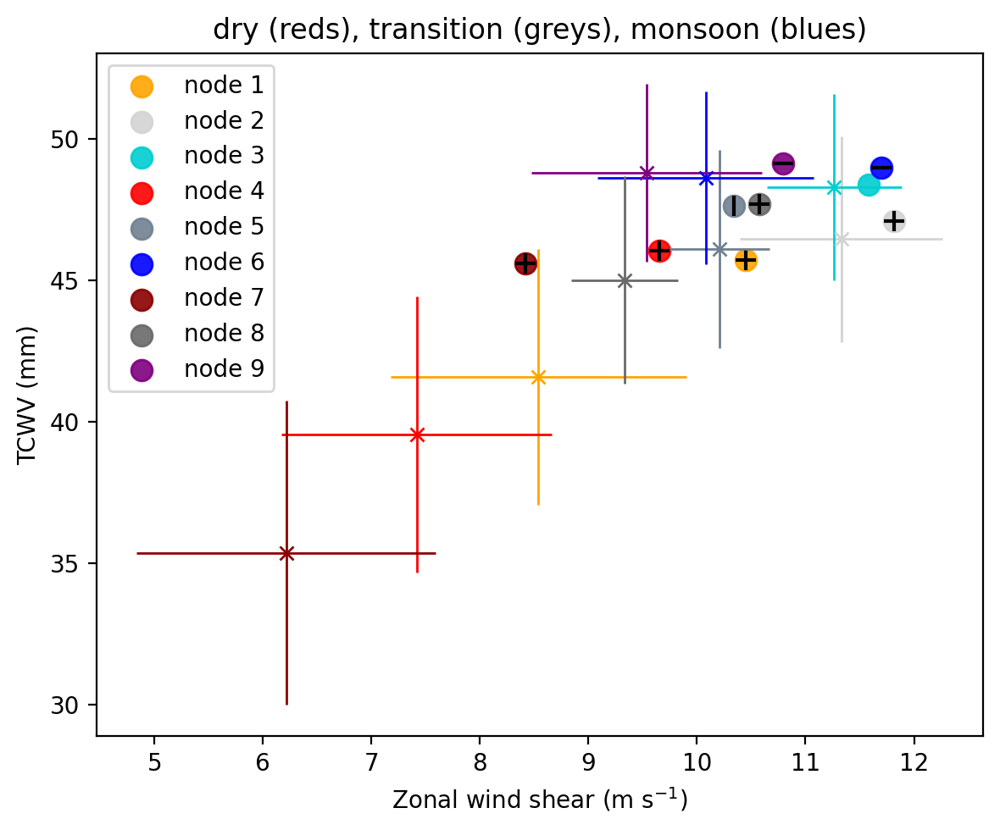

In [7]:
from utils import u_darrays as uda
f = plt.figure(figsize=(6,5), dpi=200)
mname = 'node'
colours = ['r','b', 'pink', 'purple', 'seagreen', 'orange', 'yellow', 'brown', 'grey']
plab = ['transition', 'monsoon', 'dry', 'transition', 'monsoon','dry', 'transition', 'monsoon', 'dry']
ax = f.add_subplot(111)

for ids, m in enumerate(range(1,10)):
    

    df = pd.read_csv(cnst.DATA + '/SOMS/saves/3x3_Nodes_fullYear/mcs_matchtable/node'+str(m)+'_MCS_matchTable_mergedNodes_5mmMCS_fullYear.csv', index_col=0, parse_dates=True)
    df = df.where((df.hour==18)).dropna()
    


    clim_srfc = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_clim_mean_srfc.nc')
    clim_pl = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_clim_mean_pl.nc')
    
    c_tcw = clim_srfc['tcwv']
    c_shear = (clim_pl['u'].sel(level=650) - clim_pl['u'].sel(level=925))*-1
    
    mcs_tcw = df.tcwv.mean()
    mcs_tcw_std = df.tcwv.std()
    
    mcs_shear = df.shear.mean()
    mcs_shear_std = df.shear.std()
    
    if m == 5:
        mcs_shear = mcs_shear -0.6
    
    ax.scatter(mcs_shear, mcs_tcw, label='node '+str(m), color=colord[ids], s=80, alpha=0.9)
    #plt.errorbar(mcs_shear,mcs_tcw, yerr=mcs_tcw_std, xerr=mcs_shear_std, fmt="o", color=colours[ids])
        
    ll_tcw = []
    ll_shear = []
    ll_sstd = []
    ll_tstd = []

    for ix, dff in df.iterrows():

        xv = dff.lon
        yv = dff.lat

        ll_tcw.append(c_tcw.sel(longitude=xv, latitude=yv, method='nearest').values)
        ll_shear.append(c_shear.sel(longitude=xv, latitude=yv, method='nearest').values)
        
    ax.scatter(np.mean(ll_shear), np.mean(ll_tcw), color=colord[ids], marker='', s=1)
    plt.errorbar(np.mean(ll_shear), np.mean(ll_tcw), yerr=np.std(ll_tcw), xerr=np.std(ll_shear), fmt="x", color=colord[ids], linewidth=1)
    #ipdb.set_trace()
    #print(m, 'tcw, shear', stats.ttest_ind(df.tcwv, np.array(ll_tcw)), )
    
    ttest_shear = stats.ttest_ind(df.shear, np.array(ll_shear))
    ttest_tcw = stats.ttest_ind(df.tcwv, np.array(ll_tcw))
    
        
    print(m, 'tcw', ttest_tcw)
    print(m, 'shear', ttest_shear)
    
    if (ttest_shear[1] < 0.001) & (ttest_tcw[1] > 0.001) & (m !=5):
        #plt.errorbar(mcs_shear,mcs_tcw, xerr=0.5, fmt="o", color=colours[ids])
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='_', s=70)
        
    elif (ttest_shear[1] > 0.001) & (ttest_tcw[1] < 0.001)& (m !=5):
        #plt.errorbar(mcs_shear,mcs_tcw, xerr=0.5, fmt="o", color=colours[ids])
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='|', s=70)
    
    elif (ttest_shear[1] < 0.001) & (ttest_tcw[1] < 0.001)& (m !=5):
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='+', s=70)
    
    elif (m==5):
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='|', s=70)
        
    
plt.legend() 
ax.set_ylabel('TCWV (mm)')
ax.set_xlabel(r'Zonal wind shear (m s$^{-1}$)')
plt.title('dry (reds), transition (greys), monsoon (blues)')
    
plt.tight_layout()
f.savefig(cnst.FIGS + 'SOMS/5-9N_3x3_fullYear/scatter_nodes_v2.pdf')
        

1 tcw, shear Ttest_indResult(statistic=20.775052647397374, pvalue=1.125714917797761e-87)
2 tcw, shear Ttest_indResult(statistic=3.7571608603570765, pvalue=0.0001753799316082439)
3 tcw, shear Ttest_indResult(statistic=0.45245399150278437, pvalue=0.6509924430536338)
4 tcw, shear Ttest_indResult(statistic=22.71116642557738, pvalue=1.1674940163133984e-94)
5 tcw, shear Ttest_indResult(statistic=7.96688129235869, pvalue=2.6610778255000836e-15)
6 tcw, shear Ttest_indResult(statistic=2.0676596769060915, pvalue=0.03878754904494331)
7 tcw, shear Ttest_indResult(statistic=22.40855031458101, pvalue=1.6614635319822877e-79)
8 tcw, shear Ttest_indResult(statistic=11.837515525613265, pvalue=5.648525420744991e-31)
9 tcw, shear Ttest_indResult(statistic=2.1248162550100878, pvalue=0.03370464435621969)
1 tcw Ttest_indResult(statistic=8.827598054928261, pvalue=2.136719313322268e-18)
1 shear Ttest_indResult(statistic=11.961742816731556, pvalue=5.421302660767346e-32)
2 tcw Ttest_indResult(statistic=22.374995

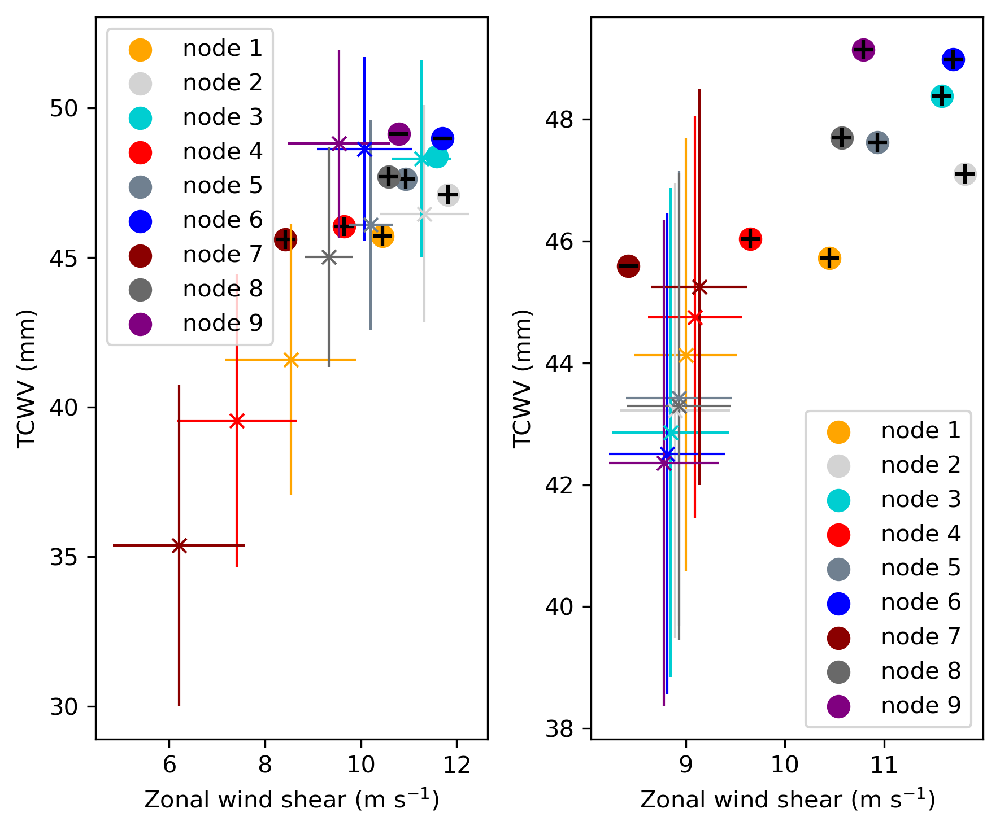

In [17]:
from utils import u_darrays as uda
f = plt.figure(figsize=(6,5), dpi=300)
mname = 'node'
colours = ['r','b', 'pink', 'purple', 'seagreen', 'orange', 'yellow', 'brown', 'grey']
ax = f.add_subplot(121)

for ids, m in enumerate(range(1,10)):
    

    df = pd.read_csv(cnst.DATA + '/SOMS/saves/3x3_Nodes_fullYear/mcs_matchtable/node'+str(m)+'_MCS_matchTable_mergedNodes_5mmMCS_fullYear.csv', index_col=0, parse_dates=True)
    df = df.where((df.hour==18)).dropna()
    


    clim_srfc = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_clim_mean_srfc.nc')
    clim_pl = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_clim_mean_pl.nc')
    
    c_tcw = clim_srfc['tcwv']
    c_shear = (clim_pl['u'].sel(level=650) - clim_pl['u'].sel(level=925))*-1
    
    mcs_tcw = df.tcwv.mean()
    mcs_tcw_std = df.tcwv.std()
    
    mcs_shear = df.shear.mean()
    mcs_shear_std = df.shear.std()
    
    ax.scatter(mcs_shear, mcs_tcw, label='node '+str(m), color=colord[ids], s=80)
    #plt.errorbar(mcs_shear,mcs_tcw, yerr=mcs_tcw_std, xerr=mcs_shear_std, fmt="o", color=colours[ids])
    

    
    
    ll_tcw = []
    ll_shear = []
    ll_sstd = []
    ll_tstd = []

    for ix, dff in df.iterrows():

        xv = dff.lon
        yv = dff.lat

        ll_tcw.append(c_tcw.sel(longitude=xv, latitude=yv, method='nearest').values)
        ll_shear.append(c_shear.sel(longitude=xv, latitude=yv, method='nearest').values)
        
    ax.scatter(np.mean(ll_shear), np.mean(ll_tcw), color=colord[ids], marker='')
    plt.errorbar(np.mean(ll_shear), np.mean(ll_tcw), yerr=np.std(ll_tcw), xerr=np.std(ll_shear), fmt="x", color=colord[ids], linewidth=1)
    #ipdb.set_trace()
    print(m, 'tcw, shear', stats.ttest_ind(df.tcwv, np.array(ll_tcw)), )
    
    ttest_shear = stats.ttest_ind(df.shear, np.array(ll_shear))
    ttest_tcw = stats.ttest_ind(df.tcwv, np.array(ll_tcw))
    
    if (ttest_shear[1] < 0.01) & (ttest_tcw[1] > 0.01):
        #plt.errorbar(mcs_shear,mcs_tcw, xerr=0.5, fmt="o", color=colours[ids])
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='_', s=70)
        
    elif (ttest_shear[1] > 0.01) & (ttest_tcw[1] < 0.01):
        #plt.errorbar(mcs_shear,mcs_tcw, xerr=0.5, fmt="o", color=colours[ids])
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='|', s=70)
    
    elif (ttest_shear[1] < 0.01) & (ttest_tcw[1] < 0.01):
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='+', s=70)
        
    
    
plt.legend() 
ax.set_ylabel('TCWV (mm)')
ax.set_xlabel(r'Zonal wind shear (m s$^{-1}$)')
#################################################################

ax = f.add_subplot(122)

for ids, m in enumerate(range(1,10)):
    

    df = pd.read_csv(cnst.DATA + '/SOMS/saves/3x3_Nodes_fullYear/mcs_matchtable/node'+str(m)+'_MCS_matchTable_mergedNodes_5mmMCS_fullYear.csv', index_col=0, parse_dates=True)
    df = df.where((df.hour==18)).dropna()
    


    clim_srfc = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_NO-MCS_mean_5-8N_srfc.nc')
    clim_pl = xr.open_dataset(cnst.DATA + 'SOMS/saves/3x3_Nodes_fullYear/node'+str(m)+'_ERA5_NO-MCS_mean_5-8N_pl.nc')
    
    c_tcw = clim_srfc['tcwv']
    c_shear = (clim_pl['u'].sel(level=650) - clim_pl['u'].sel(level=925))*-1
    
    mcs_tcw = df.tcwv.mean()
    mcs_tcw_std = df.tcwv.std()
    
    mcs_shear = df.shear.mean()
    mcs_shear_std = df.shear.std()
    
    ax.scatter(mcs_shear, mcs_tcw, label='node '+str(m), color=colord[ids], s=80)
    #plt.errorbar(mcs_shear,mcs_tcw, yerr=mcs_tcw_std, xerr=mcs_shear_std, fmt="o", color=colours[ids])
    

    
    
    ll_tcw = []
    ll_shear = []
    ll_sstd = []
    ll_tstd = []

    for ix, dff in df.iterrows():

        xv = dff.lon
        yv = dff.lat

        ll_tcw.append(c_tcw.sel(longitude=xv, latitude=yv, method='nearest').values)
        ll_shear.append(c_shear.sel(longitude=xv, latitude=yv, method='nearest').values)
        
    ax.scatter(np.mean(ll_shear), np.mean(ll_tcw), color=colord[ids], marker='')
    plt.errorbar(np.mean(ll_shear), np.mean(ll_tcw), yerr=np.std(ll_tcw), xerr=np.std(ll_shear), fmt="x", color=colord[ids], linewidth=1)
    #ipdb.set_trace()

    
    ttest_shear = stats.ttest_ind(df.shear, np.array(ll_shear))
    ttest_tcw = stats.ttest_ind(df.tcwv, np.array(ll_tcw))
    
    print(m, 'tcw', ttest_tcw)
    print(m, 'shear', ttest_shear)
    
    if (ttest_shear[1] < 0.01) & (ttest_tcw[1] > 0.01):
        #plt.errorbar(mcs_shear,mcs_tcw, xerr=0.5, fmt="o", color=colours[ids])
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='_', s=70)
        
    elif (ttest_shear[1] > 0.01) & (ttest_tcw[1] < 0.01):
        #plt.errorbar(mcs_shear,mcs_tcw, xerr=0.5, fmt="o", color=colours[ids])
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='|', s=70)
    
    elif (ttest_shear[1] < 0.01) & (ttest_tcw[1] < 0.01):
        ax.scatter(mcs_shear, mcs_tcw, color='k', marker='+', s=70)
        
    
    
plt.legend() 
ax.set_ylabel('TCWV (mm)')
ax.set_xlabel(r'Zonal wind shear (m s$^{-1}$)')
    
plt.tight_layout()
#f.savefig(cnst.FIGS + 'SOMS/5-9N_3x3_fullYear/scatter_nodes.jpg')
        